# LOGISTIC REGRESSION AND PCA WITH CRAB DATASET

Adapted from Lewis (2017), Chapter 7

We will import a dataset from MASS package, including information on crabs and we will try to classify them as male vs. female

## Libraries and dataset

In [192]:
library(data.table) # to handle the data in a more convenient manner
library(tidyverse) # for a better work flow and more tools to wrangle and visualize the data
library(plotly) # for interactive visualizations
library(corrplot) # for correlation plots
library(psych) # for visualizing relationship among pairs of variables and PCA
library(GPArotation) # for rotation of components in PCA
library(GGally) # for better visualizing relationship among pairs of variables
library(listviewer) # for visualizing nested data structures
library(MASS) # for crab dataset
library(pROC) # for ROC curve
library(ROCR) # another library for ROC curve
library(plotROC) # for pretty plot ROC curve
library(IRdisplay) # for displaying interactive ROC curves
options(warn = -1) # for suppressing messages

In [7]:
data("crabs", package = "MASS")

In [8]:
crabs_dt <- as.data.table(crabs)

## Explore data

In [9]:
?crabs

```
This data frame contains the following columns:

sp
species - "B" or "O" for blue or orange.

sex
as it says.

index
index 1:50 within each of the four groups.

FL
frontal lobe size (mm).

RW
rear width (mm).

CL
carapace length (mm).

CW
carapace width (mm).

BD
body depth (mm).
```



Get the structure:

In [10]:
str(crabs_dt)

Classes ‘data.table’ and 'data.frame':	200 obs. of  8 variables:
 $ sp   : Factor w/ 2 levels "B","O": 1 1 1 1 1 1 1 1 1 1 ...
 $ sex  : Factor w/ 2 levels "F","M": 2 2 2 2 2 2 2 2 2 2 ...
 $ index: int  1 2 3 4 5 6 7 8 9 10 ...
 $ FL   : num  8.1 8.8 9.2 9.6 9.8 10.8 11.1 11.6 11.8 11.8 ...
 $ RW   : num  6.7 7.7 7.8 7.9 8 9 9.9 9.1 9.6 10.5 ...
 $ CL   : num  16.1 18.1 19 20.1 20.3 23 23.8 24.5 24.2 25.2 ...
 $ CW   : num  19 20.8 22.4 23.1 23 26.5 27.1 28.4 27.8 29.3 ...
 $ BD   : num  7 7.4 7.7 8.2 8.2 9.8 9.8 10.4 9.7 10.3 ...
 - attr(*, ".internal.selfref")=<externalptr> 


Delete index column:

In [11]:
crabs_dt[,index := NULL]

View initial rows:

In [12]:
crabs_dt %>% head()

sp,sex,FL,RW,CL,CW,BD
B,M,8.1,6.7,16.1,19.0,7.0
B,M,8.8,7.7,18.1,20.8,7.4
B,M,9.2,7.8,19.0,22.4,7.7
B,M,9.6,7.9,20.1,23.1,8.2
B,M,9.8,8.0,20.3,23.0,8.2
B,M,10.8,9.0,23.0,26.5,9.8


### Factor variables

Let's explore and visualize factor variables:

In [13]:
crabs_dt %>% purrr::keep(is.factor) %>% purrr::map(levels)

$sp
[1] "B" "O"

$sex
[1] "F" "M"

In [14]:
crabs_factors <- crabs_dt %>% purrr::keep(is.factor) %>% # select factor columns
    tidyr::gather() %>% # convert into long format for faceting
    ggplot(aes(x = value)) + # plot value
    facet_wrap(~ key, scales = "free") + # divide into separate plots by key
    geom_bar()

plotly::ggplotly(crabs_factors)

HTML widgets cannot be represented in plain text (need html)

### Numeric variables

And let's explore and visualize numeric variables:

In [15]:
crabs_dt %>% purrr::keep(is.numeric) %>% sapply(quantile) %>% t()

,0%,25%,50%,75%,100%
FL,7.2,12.900,15.55,18.050,23.1
RW,6.5,11.000,12.80,14.300,20.2
CL,14.7,27.275,32.10,37.225,47.6
CW,17.1,31.500,36.80,42.000,54.6
BD,6.1,11.400,13.90,16.600,21.6


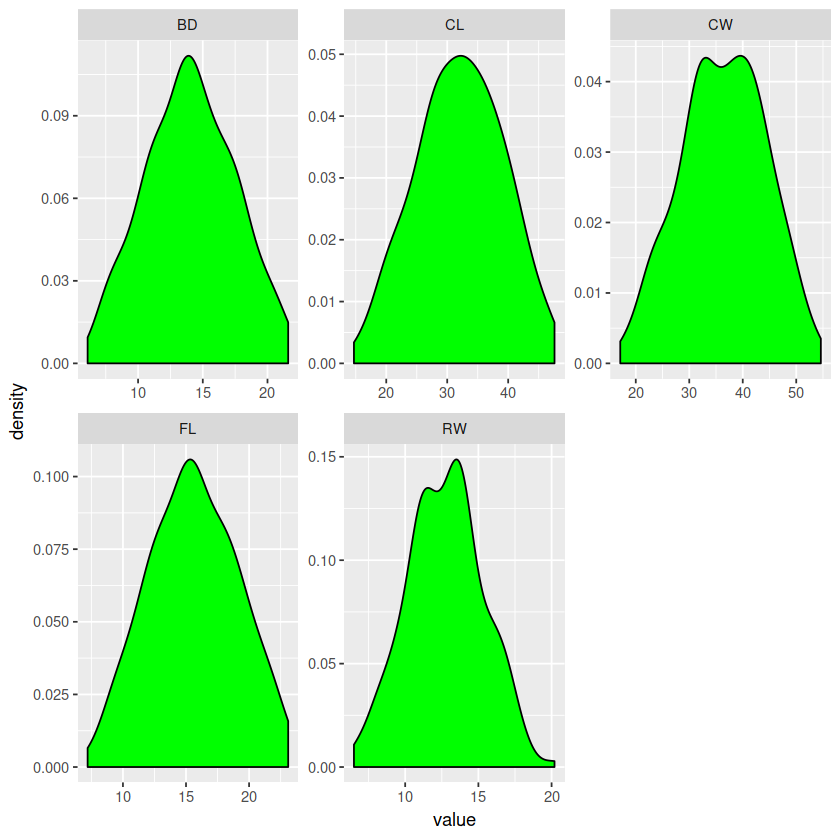

In [16]:
crabs_dt %>% purrr::keep(is.numeric) %>% # select columns
    tidyr::gather() %>% # reshape into long format in columns "key" and "value"
    ggplot(aes(value)) + # plot value
        facet_wrap(~ key, scale = "free" ) + # divide into separate plots by key
        geom_density(fill = "green")  # get density plots

### Relationships among features

View the correlation plot across numeric variables:

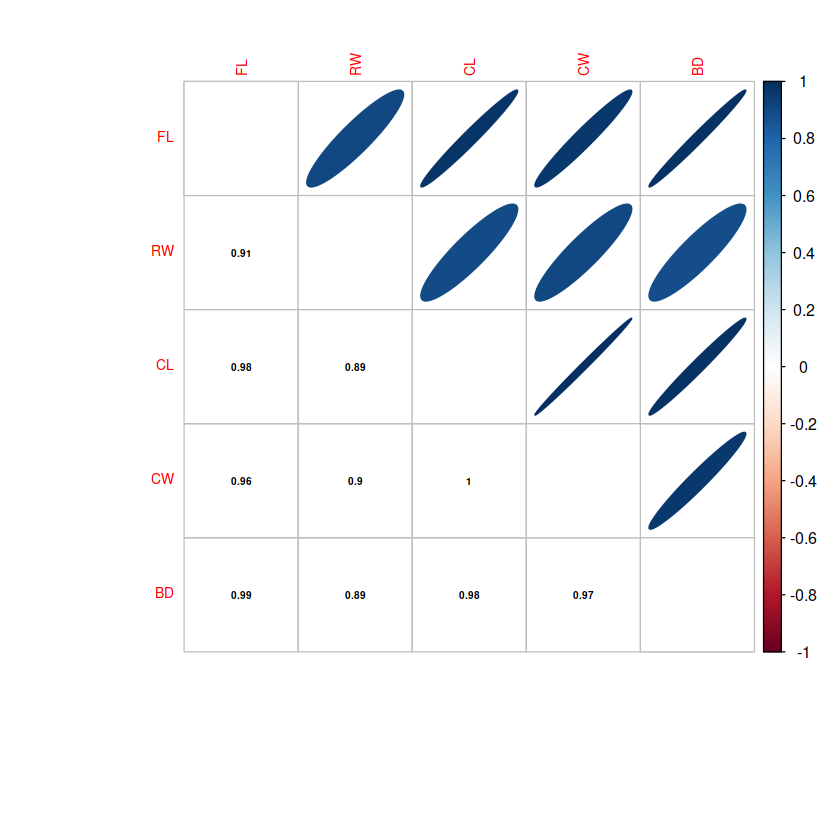

In [17]:
crabs_dt %>% purrr::keep(is.numeric) %>% cor() %>%

corrplot::corrplot.mixed(upper = "ellipse",
                         lower = "number",
                         tl.pos = "lt",
                         number.cex = .5,
                         lower.col = "black",
                         tl.cex = 0.7)

We see that many variables are highly correlated

### Scatterplots

Let's combine, histograms, density plots, correlations and scatterplots:

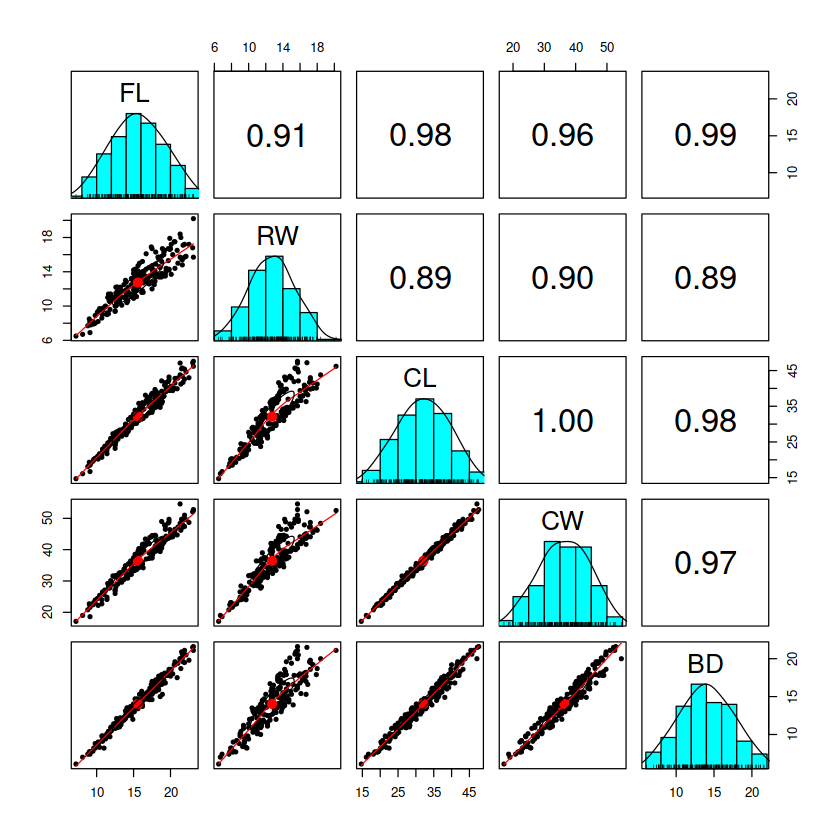

In [18]:
crabs_dt %>% purrr::keep(is.numeric) %>% psych::pairs.panels()

In [155]:
crabs_dt %>% purrr::keep(is.numeric) %>% GGally::ggpairs() %>% ggplotly()

HTML widgets cannot be represented in plain text (need html)

## Partition the dataset

y will be the target variable: The labels

In [20]:
y <- crabs$sex

Select 150 indices for train set:

In [21]:
set.seed(2018)
train <- crabs_dt[,sample(.I, 150)]
head(train)

[1]  68  93  12  39 199  59

And split the dataset:

In [22]:
y_train <- y[train]
y_test <- y[-train]

crabs_train <- crabs_dt[train]
crabs_test <- crabs_dt[-train]

## Build and train a model

Similar to linear regression, logistic regression assumes the features are independent.

We saw earlier that there is high correlation between the features.

Given this, we will fit our initial model using FL, RW, and the categorical variable sp.

The logistic regression can be fitted to the sample data using the glm function, with the family argument set to binomial:

First, create the formula:

In [23]:
formula1 <- reformulate(c("sp", "FL", "RW"), "y_train")
formula1

y_train ~ sp + FL + RW

And run the logistic regression model:

In [24]:
fit1 <- glm(formula1,
            family=binomial(link='logit'),
            data=crabs_train)

## Evaluate model

View the summary of the model:

In [25]:
summary(fit1)


Call:
glm(formula = formula1, family = binomial(link = "logit"), data = crabs_train)

Deviance Residuals: 
     Min        1Q    Median        3Q       Max  
-2.17068  -0.16571  -0.00255   0.20631   2.14300  

Coefficients:
            Estimate Std. Error z value Pr(>|z|)    
(Intercept)    8.777      2.059   4.263 2.02e-05 ***
spO           -3.919      1.104  -3.551 0.000384 ***
FL             3.725      0.722   5.160 2.47e-07 ***
RW            -5.111      0.967  -5.286 1.25e-07 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for binomial family taken to be 1)

    Null deviance: 207.917  on 149  degrees of freedom
Residual deviance:  58.703  on 146  degrees of freedom
AIC: 66.703

Number of Fisher Scoring iterations: 7


### Deviance residuals

Like the residual in a linear regression model, the deviance residuals are a measure of model fit.

Smaller absolute values indicate better fit. This part of the output shows minimum, quantiles, and the maximum of the deviance residuals for individual sample examples used to fit the model. The maximum deviance is 2.143, with a very small median value of -0.00255.

In [26]:
summary(fit1)$deviance.resid %>% summary()

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-2.170676 -0.165713 -0.002553  0.007532  0.206310  2.142998 

### Estimated coefficients

In [27]:
summary(fit1)$coefficients

,Estimate,Std. Error,z value,Pr(>|z|)
(Intercept),8.776664,2.0586938,4.263220,2.015023e-05
spO,-3.919181,1.1036367,-3.551151,3.835501e-04
FL,3.725478,0.7220343,5.159697,2.473497e-07
RW,-5.111268,0.9669501,-5.285969,1.250413e-07


The estimated coefficients are shown in the next part of the output.

They indicate that FL influences crab sex positively, while sp and RW have a negative effect.

The estimated values tell us the change in the log odds of the target variable for a one unit increase in a feature variable.

As an example, for a one unit increase in FL, the log odds of being a male crab (versus female) increases by 3.725. 

However, for a one unit increase in RW, the log odds of being a male crab decreases by 5.11.

###  Statistical significance of coefficients

In [28]:
confint.default(fit1)

,2.5 %,97.5 %
(Intercept),4.741698,12.811630
spO,-6.082269,-1.756093
FL,2.310317,5.140640
RW,-7.006455,-3.216081


For logistic models, R reports the confidence intervals using
the profiled log-likelihood function.

To see these:

In [29]:
confint(fit1)

Waiting for profiling to be done...


,2.5 %,97.5 %
(Intercept),5.179986,13.394192
spO,-6.432662,-2.013659
FL,2.542425,5.430374
RW,-7.386849,-3.522703


Since none of the confidence intervals straddle 0, we can have some empirically grounded certainty that the sign of the estimated coefficients captures the direction of the relationship of the features to the log odds of being a male crab.

### Variable importance

The absolute value of the z-score is often used to measure variable importance.

In this case, RW with an absolute value of 5.286, followed by FL with an absolute value of 5.160 are the most influential features.

This is useful to know, and makes sense because both features are related to body size.

In [30]:
summary(fit1)$coefficients

,Estimate,Std. Error,z value,Pr(>|z|)
(Intercept),8.776664,2.0586938,4.263220,2.015023e-05
spO,-3.919181,1.1036367,-3.551151,3.835501e-04
FL,3.725478,0.7220343,5.159697,2.473497e-07
RW,-5.111268,0.9669501,-5.285969,1.250413e-07


### Null and residual deviance

The residual deviance is analogous to the residual sum of squares of a linear regression model.

Lower values indicate better fit.

It takes a value of 58.703.

The null deviance reports how well the target variable is predicted by a model that includes only the intercept.

We would expect our model to do better than this.

In this case it does, as the null deviance = 207.917.

This implies our model has reduced the deviance by just over 149 points.

In [31]:
fit1$deviance
fit1$null.deviance

[1] 58.7032

[1] 207.9175

### AIC and Fisher scoring

The following two items are also reported via the summary function:

- The Akaike Information Criterion (AIC) is a measure of the relative quality of statistical models. It is only useful for comparing models.
- The “Number of Fisher Scoring” iterations simply tells you how many iterations were needed to fit the model by maximum likelihood.

In [32]:
fit1$aic
fit1$iter

[1] 66.7032

[1] 7

### ANOVA

How well our model fits, depends on the difference between the model and the observed data.

One approach to evaluate this is to use the anova function:

In [33]:
anova(fit1 , test="Chisq")

,Df,Deviance,Resid. Df,Resid. Dev,Pr(>Chi)
NULL,NA,NA,149,207.9175,NA
sp,1,0.4329793,148,207.4845,5.105307e-01
FL,1,0.5333667,147,206.9511,4.651949e-01
RW,1,148.2479418,146,58.7032,4.187285e-34


The anova function adds the features in the order given in the model formula (left to right).

Hence, sp appears first followed by FL and RW.

Analyzing the table, we observe a small drop in deviance when adding each sp and FL. For example, adding sp, reduces the deviance from the Null model’s value of 207.917 to 207.485.

This is a tiny drop. We see a similar pattern for adding in FL.

In this case, the model deviance drops by 0.533 to 206.951.

The addition of these two variables moves the model deviation in the right directions (downward).

However, as indicated by the large p-value (Pr(>Chi)) on both sp and FL, the change in not statistically significant

This indicates the model without these variables explains approximately the same amount of variation

Fortunately, adding the feature, RW leads to a significant reduction in deviance of over 148 points

A highly significant p-value here, supports the importance of this feature

### Pseudo R<sup>2</sup> statistic

Pseudo R statistic for logistic regression.

The pseudo-R2 is a useful goodness-of-fit metric for logistic regression.

Similar to the traditional R2 statistic, it takes a value between 0 and 1. It is calculated as:

$${\text{pseudo } R^{2}} = 1- \frac{\text{model deviance}}{{\text{Null deviance}}}$$

In [34]:
1 - (fit1$deviance / fit1$null.deviance)

[1] 0.7176611

The closer to 1 is the metric, the more useful are the features in predicting the target variable

In statistical language, it is more a measure of effect size than overall fit

In any case, the value of 0.717 indicates that the model is useful for predicting crab sex

### Model discrimination, ROC, and AUC

The discrimination of a model – that is, how well the model separates male from female crabs - can also be assessed using the area under the receiver operating characteristic curve (AUC)

It uses two metrics, Specificity and Sensitivity.

Specificity is a measure of how often the model predicts “female”(y = 0) when the actual observation is “female crab”

$${\text{Specificity}} = \frac{\text{True Negatives}}{{\text{Total Negatives}}}$$

Sensitivity or true positive rate measures when it’s actually “male”, how often does the model predict “male”

$${\text{Sensitivity}} = \frac{\text{True Positives}}{{\text{Total Positives}}}$$

Specificity and Sensitivity are often combined via a Receiver Operating Characteristic Curve (ROC).

The ROC visually measures how well the predictive model separates the data into positives and negatives

![ROC](https://www.researchgate.net/publication/8636163/figure/fig2/AS:202684352208899@1425335123086/Four-ROC-curves-with-different-values-of-the-area-under-the-ROC-curve-A-perfect-test-A.png)

Four ROC curves with different values of the area under the ROC curve:
- A perfect test (A) has an area under the ROC curve of 1.
- The chance diagonal (D, the line segment from 0, 0 to 1, 1) has an area under the ROC curve of 0.5.
- ROC curves of tests with some ability to distinguish between those subjects with and those without a disease (B, C) lie between these two extremes.
- Test B with the higher area under the ROC curve has a better overall diagnostic performance than test C.

(https://www.researchgate.net/figure/Four-ROC-curves-with-different-values-of-the-area-under-the-ROC-curve-A-perfect-test-A_fig2_8636163)

#### ROC curve with pROC package

First, get the predicted log odd values for the train set:

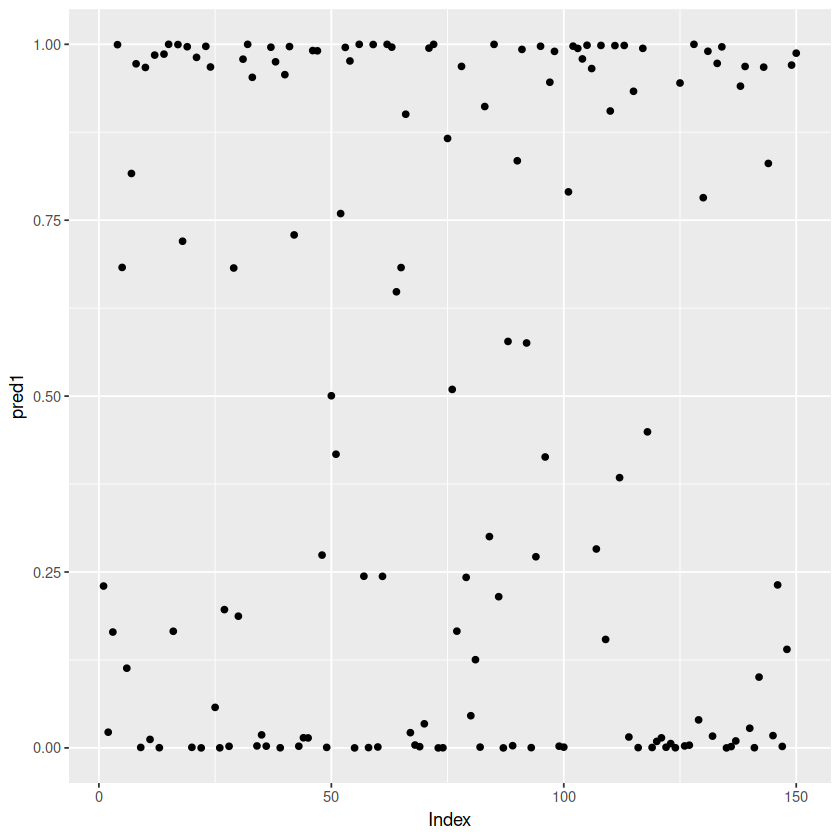

In [36]:
pred1 <- predict(fit1 , type="response")

as.data.table(pred1) %>%
ggplot(aes(x = seq_along(pred1), y = pred1)) +
xlab("Index") +
geom_point()

Since levels are given as 1 for F and 2 for M (probably alphabetically), the predicted values are the log odds of being M

Now create a roc object for predicted log odd values and the actual class labels

In [148]:
roc <- pROC::roc(y_train, pred1)

In [149]:
roc


Call:
roc.default(response = y_train, predictor = pred1)

Data: pred1 in 76 controls (y_train F) < 74 cases (y_train M).
Area under the curve: 0.9755

The train set data gave a value of 0.9067, indicating that the model discriminates well

The confidence interval can be called using the ci function:

In [150]:
pROC::ci(roc)

95% CI: 0.9569-0.994 (DeLong)

Plot the ROC curve with base plot:

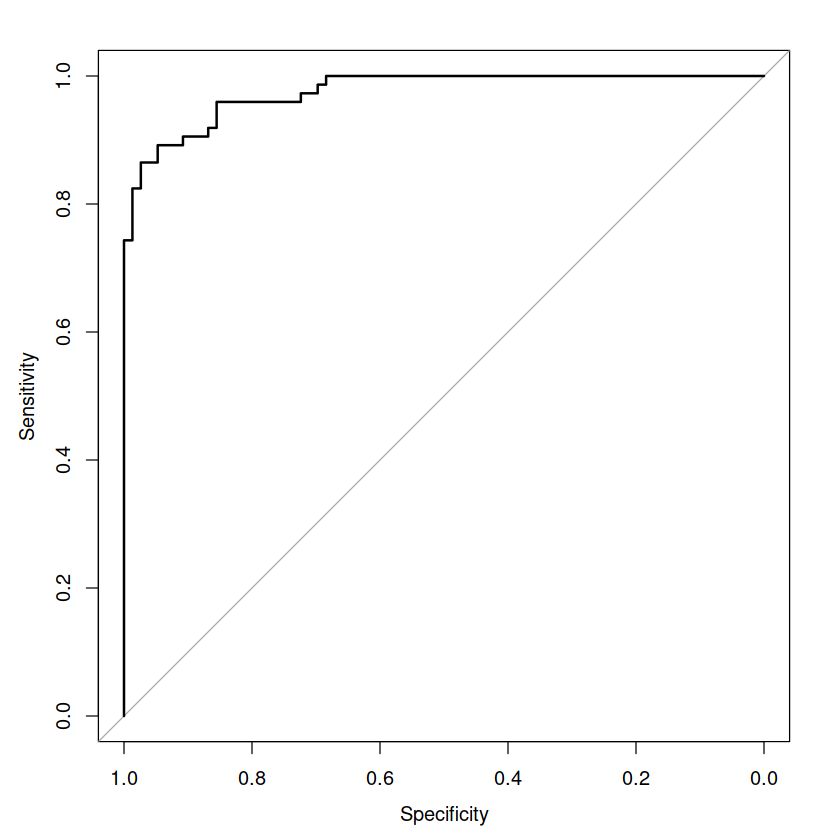

In [151]:
plot(roc)

A fancier option is from plotROC package:

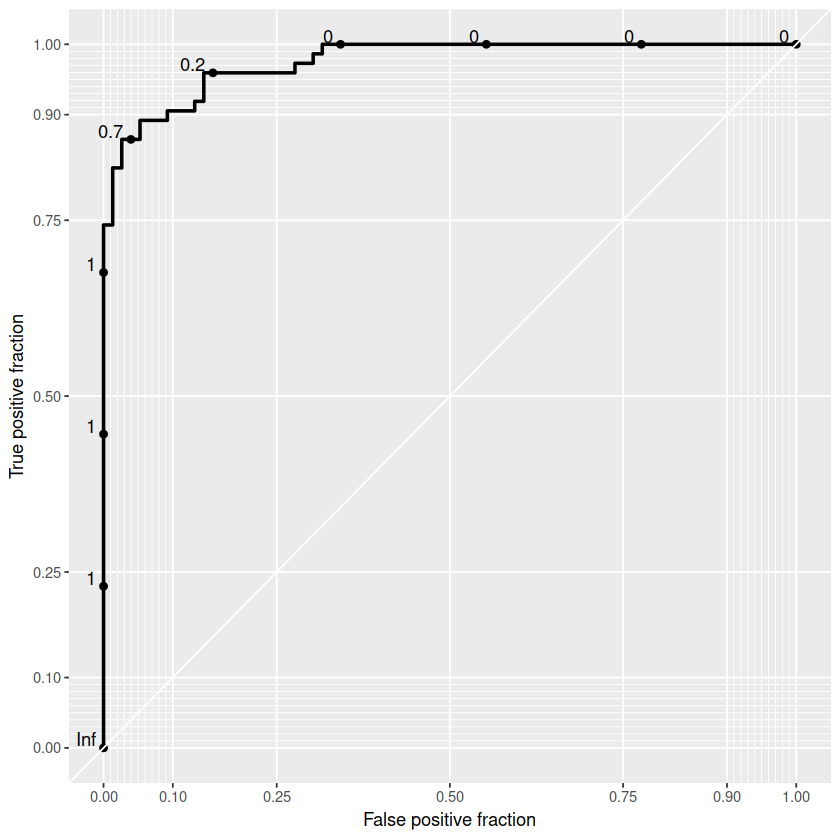

In [166]:
p1 <- data.table(D = y_train, M = pred1) %>%
ggplot(aes(m = M, d = D)) +
    plotROC::geom_roc() +
    plotROC::style_roc(theme = theme_grey)

p1

Or an interactive version of the same plot:

In [167]:
export_interactive_roc(p1) %>% IRdisplay::display_html()

Scale for 'x' is already present. Adding another scale for 'x', which will
replace the existing scale.
Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.


<?xml version="1.0" encoding="UTF-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polyline id="aGRID.polyline.5500.1.1" points="58.72,50.69 58.72,55.52 58.72,55.52 58.72,55.52 58.72,55.52 58.72,55.52 58.72,55.52 58.72,55.52 58.72,60.36 58.72,60.36 58.72,60.36 58.72,60.36 58.72,60.36 58.72,60.36 58.72,60.36 58.72,65.2 58.72,65.2 58.72,65.2 58.72,65.2 58.72,65.2 58.72,65.2 58.72,65.2 58.72,70.04 58.72,70.04 58.72,70.04 58.72,70.04 58.72,70.04 58.72,70.04 58.72,74.87 58.72,74.87 58.72,74.87 58.72,74.87 58.72,74.87 58.72,74.87 58.72,74.87 58.72,79.71 58.72,79.71 58.72,79.71 58.72,79.71 58.72,79.71 58.72,79.71 58.72,79.71 58.72,84.55 58.72,84.55 58.72,84.55 58.72,84.55 58.72,84.55 58.72,84.55 58.72,89.38 58.72,89.38 58.72,89.38 58.72,89.38 58.72,89.38 58.72,89.38 58.72,89.38 58.72,94.22 58.72,94.22 58.72,94.22 58.72,94.22 58.72,94.22 58.72,94.22 58.72,94.22 58.72,99.06 58.72,99.06 58.72,99.06 58.72,99.06 58.72,99.06 58.72,99.06 58.72,99.06 58.72,103.89 58.72,103.89 58.72,103.89 58.72,103.89 58.72,103.89 58.72,103.89 58.72,108.73 58.72,108.73 58.72,108.73 58.72,108.73 58.72,108.73 58.72,108.73 58.72,108.73 58.72,113.57 58.72,113.57 58.72,113.57 58.72,113.57 58.72,113.57 58.72,113.57 58.72,113.57 58.72,118.41 58.72,118.41 58.72,118.41 58.72,118.41 58.72,118.41 58.72,118.41 58.72,123.24 58.72,123.24 58.72,123.24 58.72,123.24 58.72,123.24 58.72,123.24 58.72,123.24 58.72,128.08 58.72,128.08 58.72,128.08 58.72,128.08 58.72,128.08 58.72,128.08 58.72,128.08 58.72,132.92 58.72,132.92 58.72,132.92 58.72,132.92 58.72,132.92 58.72,132.92 58.72,137.75 58.72,137.75 58.72,137.75 58.72,137.75 58.72,137.75 58.72,137.75 58.72,137.75 58.72,142.59 58.72,142.59 58.72,142.59 58.72,142.59 58.72,142.59 58.72,142.59 58.72,142.59 58.72,147.43 58.72,147.43 58.72,147.43 58.72,147.43 58.72,147.43 58.72,147.43 58.72,147.43 58.72,152.26 58.72,152.26 58.72,152.26 58.72,152.26 58.72,152.26 58.72,152.26 58.72,157.1 58.72,157.1 58.72,157.1 58.72,157.1 58.72,157.1 58.72,157.1 58.72,157.1 58.72,161.94 58.72,161.94 58.72,161.94 58.72,161.94 58.72,161.94 58.72,161.94 58.72,161.94 58.72,166.77 58.72,166.77 58.72,166.77 58.72,166.77 58.72,166.77 58.72,166.77 58.72,171.61 58.72,171.61 58.72,171.61 58.72,171.61 58.72,171.61 58.72,171.61 58.72,171.61 58.72,176.45 58.72,176.45 58.72,176.45 58.72,176.45 58.72,176.45 58.72,176.45 58.72,176.45 58.72,181.29 58.72,181.29 58.72,181.29 58.72,181.29 58.72,181.29 58.72,181.29 58.72,181.29 58.72,186.12 58.72,186.12 58.72,186.12 58.72,186.12 58.72,186.12 58.72,186.12 58.72,190.96 58.72,190.96 58.72,190.96 58.72,190.96 58.72,190.96 58.72,190.96 58.72,190.96 58.72,195.8 58.72,195.8 58.72,195.8 58.72,195.8 58.72,195.8 58.72,195.8 58.72,195.8 58.72,200.63 58.72,200.63 58.72,200.63 58.72,200.63 58.72,200.63 58.72,200.63 58.72,205.47 58.72,205.47 58.72,205.47 58.72,205.47 58.72,205.47 58.72,205.47 58.72,205.47 58.72,210.31 58.72,210.31 58.72,210.31 58.72,210.31 58.72,210.31 58.72,210.31 58.72,210.31 58.72,215.14 58.72,215.14 58.72,215.14 58.72,215.14 58.72,215.14 58.72,215.14 58.72,219.98 58.72,219.98 58.72,219.98 58.72,219.98 58.72,219.98 58.72,219.98 58.72,219.98 58.72,224.82 58.72,224.82 58.72,224.82 58.72,224.82 58.72,224.82 58.72,224.82 58.72,224.82 58.72,229.66 58.72,229.66 58.72,229.66 58.72,229.66 58.72,229.66 58.72,229.66 58.72,229.66 58.72,234.49 58.72,234.49 58.72,234.49 58.72,234.49 58.72,234.49 58.72,234.49 58.72,239.33 58.72,239.33 58.72,239.33 58.72,239.33 58.72,239.33 58.72,239.33 58.72,239.33 58.72,244.17 58.72,244.17 58.72,244.17 58.72,244.17 58.72,244.17 58.72,244.17 58.72,244.17 58.72,249 58.72,249 58.72,249 58.72,249 58.72,249 58.72,249 58.72,253.84 58.72,253.84 58.72,253.84 58.72,253.84 58.72,253.84 58.72,253.84 58.72,253.84 58.72,258.68 58.72,258.68 58.72,258.68 58.72,258.68 58.72,258.68 58.72,258.68 58.72,258.68 5

The closer the curve is to the perfect classifier, the better it is at identifying positive 
values. This can be measured using a statistic known as the area under the ROC 
curve (abbreviated AUC). The AUC treats the ROC diagram as a two-dimensional 
square and measures the total area under the ROC curve. AUC ranges from 0.5 (for 
a classifier with no predictive value) to 1.0 (for a perfect classifier). A convention to 
interpret AUC scores uses a system similar to academic letter grades:

- A: Outstanding = 0.9 to 1.0
- B: Excellent/good = 0.8 to 0.9
- C: Acceptable/fair = 0.7 to 0.8
- D: Poor = 0.6 to 0.7
- E: No discrimination = 0.5 to 0.6

In [145]:
auc(roc)

Area under the curve: 0.9755

AUC is outstanding

#### ROC curve with ROCR library

Adapted from Lantz (2015) Chapter 10

First we create a prediction object, taking into account the log odds:

In [96]:
pred_ROCR <- ROCR::prediction(predictions = pred1,
                             labels = y_train,
                             label.ordering = c("F", "M"))

And then a performance object for true positives vs false positives:

In [97]:
perf <- ROCR::performance(pred_ROCR,
                            measure = "tpr",
                            x.measure = "fpr")

And let's plot it:

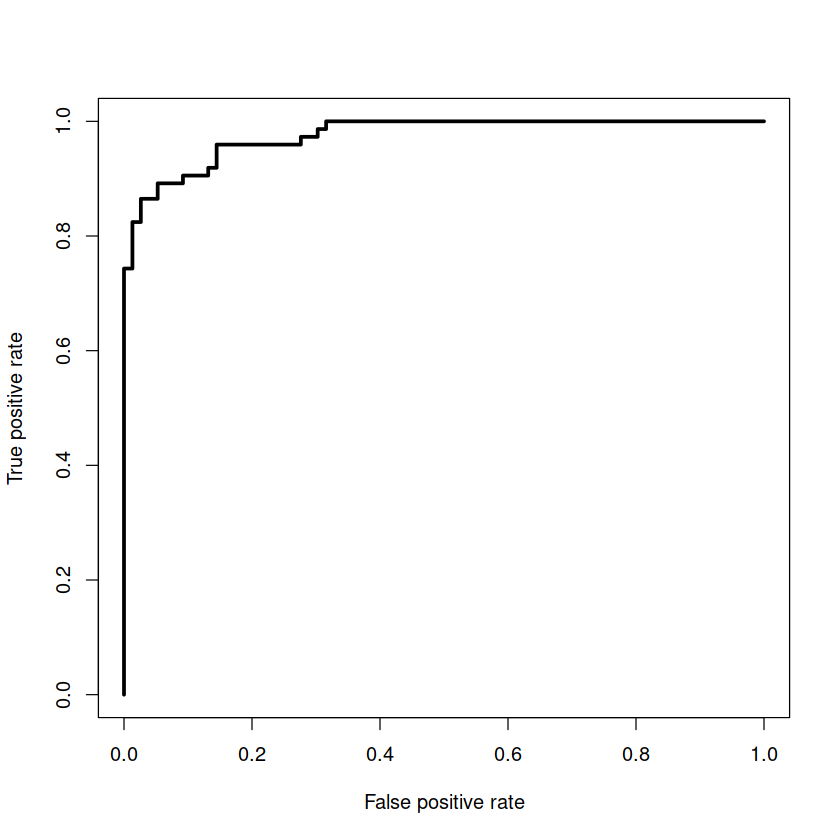

In [101]:
plot(perf, lwd = 3)

For AUC calculation:

In [147]:
perf_auc <- ROCR::performance(pred_ROCR, measure = "auc")
perf_auc@y.values %>% unlist()

[1] 0.9754623

### Classification accuracy

Let's convert log odd values to class labels:

In [125]:
pred1_train_f <- factor(ifelse(pred1 > 0.5, "M", "F"))

And create a confusion matrix:

In [45]:
cm1_train <- table(y_train, pred1_train_f) %>% caret::confusionMatrix()
cm1_train

Confusion Matrix and Statistics

       pred1_train_f
y_train  F  M
      F 69  7
      M  7 67
                                         
               Accuracy : 0.9067         
                 95% CI : (0.8484, 0.948)
    No Information Rate : 0.5067         
    P-Value [Acc > NIR] : <2e-16         
                                         
                  Kappa : 0.8133         
 Mcnemar's Test P-Value : 1              
                                         
            Sensitivity : 0.9079         
            Specificity : 0.9054         
         Pos Pred Value : 0.9079         
         Neg Pred Value : 0.9054         
             Prevalence : 0.5067         
         Detection Rate : 0.4600         
   Detection Prevalence : 0.5067         
      Balanced Accuracy : 0.9067         
                                         
       'Positive' Class : F              
                                         

Classification accuracy is 0.9067

## Predictive power

Lets predict the log odd values for the test dataset:

In [46]:
pred1_test <- predict(fit1,
                      newdata = crabs_test)

And convert them to class labels:

In [47]:
predclass1_test <- ifelse(pred1_test > 0.5, "M", "F") %>% factor()

Create the confusion matrix:

In [48]:
cm1_test <- table(y_test, predclass1_test) %>% caret::confusionMatrix()
cm1_test

Confusion Matrix and Statistics

      predclass1_test
y_test  F  M
     F 23  1
     M  2 24
                                          
               Accuracy : 0.94            
                 95% CI : (0.8345, 0.9875)
    No Information Rate : 0.5             
    P-Value [Acc > NIR] : 1.854e-11       
                                          
                  Kappa : 0.88            
 Mcnemar's Test P-Value : 1               
                                          
            Sensitivity : 0.9200          
            Specificity : 0.9600          
         Pos Pred Value : 0.9583          
         Neg Pred Value : 0.9231          
             Prevalence : 0.5000          
         Detection Rate : 0.4600          
   Detection Prevalence : 0.4800          
      Balanced Accuracy : 0.9400          
                                          
       'Positive' Class : F               
                                          

We have an accuracy of 0.94

## Improve model performance

### Principal Components Analysis (PCA)

Let's look at the relationships among numeric variables again:

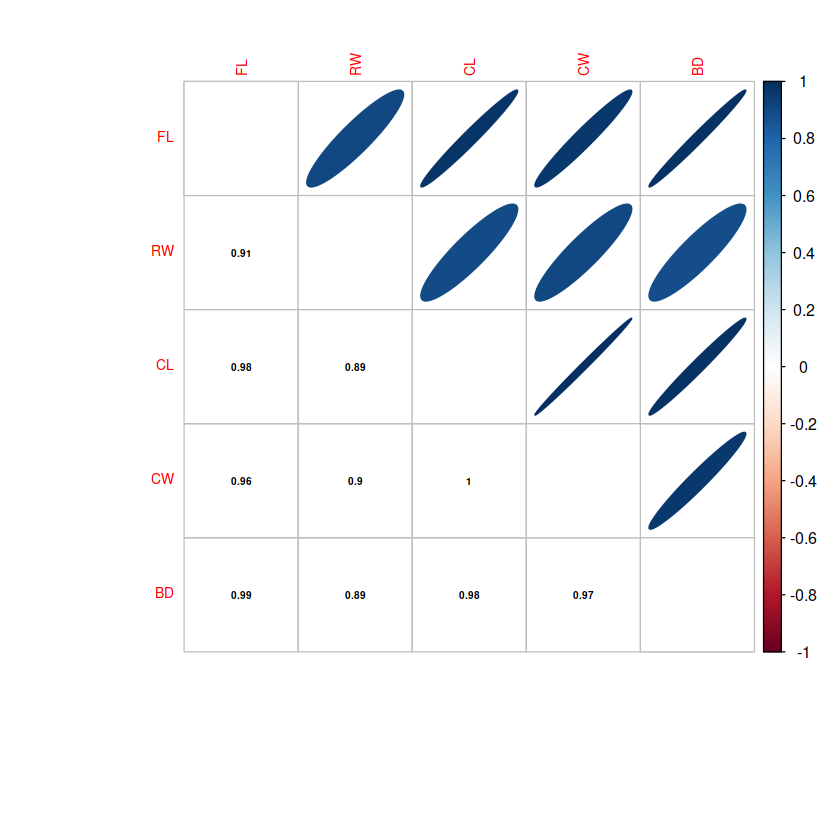

In [157]:
crabs_dt %>% purrr::keep(is.numeric) %>% cor() %>%

corrplot::corrplot.mixed(upper = "ellipse",
                         lower = "number",
                         tl.pos = "lt",
                         number.cex = .5,
                         lower.col = "black",
                         tl.cex = 0.7)

In [156]:
crabs_dt %>% purrr::keep(is.numeric) %>% GGally::ggpairs() %>% ggplotly()

HTML widgets cannot be represented in plain text (need html)

What stands out is the very high correlation between the attributes.

This is not surprising as they are all measurements related to body
size.

However, it violates the assumption that features are independent.

What to do?

One solution is to use the principal components.

#### PCA with base-r

The prcomp function calculates the principal components:

In [49]:
pca <- crabs_dt %>%
    purrr::keep(is.numeric) %>%
    prcomp(center = T,
           scale = T)

PCA components are linear combinations of the original features.

In [50]:
pca

Standard deviations (1, .., p=5):
[1] 2.18834065 0.38946785 0.21594669 0.10552420 0.04137243

Rotation (n x k) = (5 x 5):
         PC1        PC2         PC3          PC4         PC5
FL 0.4520437  0.1375813  0.53076841  0.696923372  0.09649156
RW 0.4280774 -0.8981307 -0.01197915 -0.083703203 -0.05441759
CL 0.4531910  0.2682381 -0.30968155 -0.001444633 -0.79168267
CW 0.4511127  0.1805959 -0.65256956  0.089187816  0.57452672
BD 0.4511336  0.2643219  0.44316103 -0.706636423  0.17574331

Let’s look at the PCA coefficient weights:

In [51]:
pca$rotation %>% round(3)

,PC1,PC2,PC3,PC4,PC5
FL,0.452,0.138,0.531,0.697,0.096
RW,0.428,-0.898,-0.012,-0.084,-0.054
CL,0.453,0.268,-0.310,-0.001,-0.792
CW,0.451,0.181,-0.653,0.089,0.575
BD,0.451,0.264,0.443,-0.707,0.176


See whether components are orthagonal (uncorrelated)

In [52]:
cor(pca$x) %>% round(2)

,PC1,PC2,PC3,PC4,PC5
PC1,1,0,0,0,0
PC2,0,1,0,0,0
PC3,0,0,1,0,0
PC4,0,0,0,1,0
PC5,0,0,0,0,1


Yes, cross correlations are near zero

##### Proportion of variance explained

The proportion of variation explained by each principal component can be viewed using the summary function:

In [53]:
summary(pca)

Importance of components:
                          PC1     PC2     PC3     PC4     PC5
Standard deviation     2.1883 0.38947 0.21595 0.10552 0.04137
Proportion of Variance 0.9578 0.03034 0.00933 0.00223 0.00034
Cumulative Proportion  0.9578 0.98810 0.99743 0.99966 1.00000

The first component explains 95.8% of the variation in the feature data, and the second component 3%

Since, these two components account for over 98% of the variation in the data, we will use them as our independent variables in the logistic regression model.

To do this we create a new R object called pca_dt:

In [159]:
pca_dt <- pca$x[,c("PC1", "PC2")] %>% as.data.table()

#### PCA with psych package

Adapted from Lesmeister (2015), Chapter 9

To extract the components with the psych package, you will use the principal() function.

We will state that we do not want to rotate the components at this time.

In [183]:
?principal

In [193]:
pca2 <- crabs_dt %>%
    purrr::keep(is.numeric) %>%
    psych::principal(nfactors = 5, rotate = "none")

In [182]:
pca2

Principal Components Analysis
Call: psych::principal(r = ., nfactors = 5, rotate = "none")
Standardized loadings (pattern matrix) based upon correlation matrix
    PC1   PC2   PC3   PC4   PC5 h2      u2 com
FL 0.99 -0.05 -0.11 -0.07  0.00  1 8.9e-16 1.0
RW 0.94  0.35  0.00  0.01  0.00  1 3.6e-15 1.3
CL 0.99 -0.10  0.07  0.00 -0.03  1 2.4e-15 1.0
CW 0.99 -0.07  0.14 -0.01  0.02  1 2.8e-15 1.1
BD 0.99 -0.10 -0.10  0.07  0.01  1 2.7e-15 1.1

                       PC1  PC2  PC3  PC4 PC5
SS loadings           4.79 0.15 0.05 0.01   0
Proportion Var        0.96 0.03 0.01 0.00   0
Cumulative Var        0.96 0.99 1.00 1.00   1
Proportion Explained  0.96 0.03 0.01 0.00   0
Cumulative Proportion 0.96 0.99 1.00 1.00   1

Mean item complexity =  1.1
Test of the hypothesis that 5 components are sufficient.

The root mean square of the residuals (RMSR) is  0 
 with the empirical chi square  0  with prob <  NA 

Fit based upon off diagonal values = 1

How many of the components should we take?

A good rule of thumb is to select the components that account for at least 70 percent of the total variance, which means that the variance explained by each of the selected components accounts for 70 percent of the variance explained by all the components. 

A visual technique is to do a scree plot.

A scree plot can aid you in assessing the components that explain the most variance in the data.

It shows the Component number on the x axis and their associated Eigenvalues on the y axis.

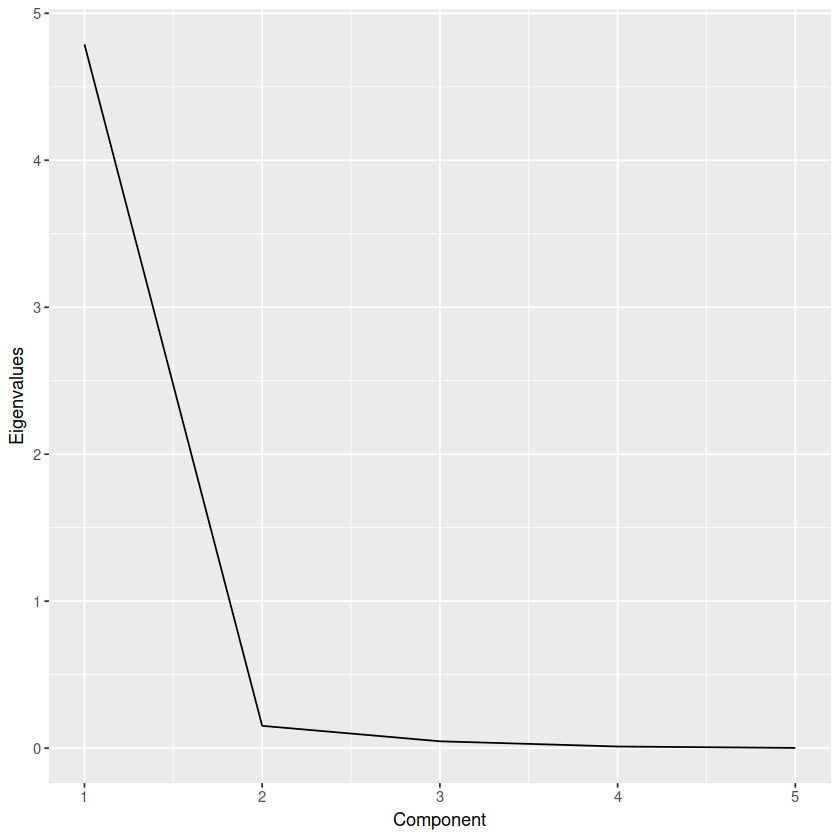

In [191]:
pca2$values %>% as.data.table() %>%
ggplot(aes(x = seq_along(.), y = .)) +
geom_line() +
xlab("Component") +
ylab("Eigenvalues")

What you are looking in a scree plot is with eigenvalues that are greater than one and the point where the additional 
variance explained by a component does not differ greatly from one component to the next.

In other words, it is the break point where the plot flattens out. In this, two components look pretty compelling.

Now let's rotate the two components:

```
rotate	
"none", "varimax", "quartimax", "promax", "oblimin", "simplimax", and "cluster" are possible rotations/transformations of the solution. See fa for all rotations avaiable.
```

In [200]:
?principal

In [208]:
pca3 <- crabs_dt %>%
    purrr::keep(is.numeric) %>%
    psych::principal(nfactors = 2, rotate = "simplimax")

In [209]:
pca3

Principal Components Analysis
Call: psych::principal(r = ., nfactors = 2, rotate = "simplimax")
Standardized loadings (pattern matrix) based upon correlation matrix
    TC1   TC2   h2      u2 com
FL 0.99 -0.05 0.98 0.01856 1.0
RW 0.94  0.35 1.00 0.00009 1.3
CL 0.99 -0.10 0.99 0.00555 1.0
CW 0.99 -0.07 0.98 0.02051 1.0
BD 0.99 -0.10 0.99 0.01477 1.0

                       TC1  TC2
SS loadings           4.79 0.15
Proportion Var        0.96 0.03
Cumulative Var        0.96 0.99
Proportion Explained  0.97 0.03
Cumulative Proportion 0.97 1.00

 With component correlations of 
    TC1 TC2
TC1   1   0
TC2   0   1

Mean item complexity =  1.1
Test of the hypothesis that 2 components are sufficient.

The root mean square of the residuals (RMSR) is  0.01 
 with the empirical chi square  0.26  with prob <  0.61 

Fit based upon off diagonal values = 1

And the component scores can be viewed with:

In [210]:
pca3$scores

TC1,TC2
-2.24610313,-0.68753647
-1.99932182,-0.24093929
-1.88194158,-0.43252146
-1.77027272,-0.63007133
-1.74765194,-0.57412993
-1.34602603,-0.56351247
-1.22089669,0.09994509
-1.16163757,-0.93068935
-1.17838505,-0.29975438
-1.00548202,0.20275907


### Fit model with pcs

We fit the model using the training data

In [55]:
pca_train <- pca_dt[train]

In [56]:
fit2 <- glm(y_train ~ .,
           data = pca_train,
           family = "binomial")

See the coefficients:

In [57]:
fit2$coefficients %>% round(3)

(Intercept)         PC1         PC2 
      0.572       0.328      21.217

It appears that both PC1 and PC2 influence crab sex positively

For a one unit increase in PC1, the log odds of being a male crab (versus female) increases by 0.328

However, notice for pca2 the effect size at 21.217 is many multiple times larger than that of pca1

Such a large difference cannot be ignored

Let’s take a look at the statistics, in terms of the confidence interval of the estimates:

In [58]:
confint.default(fit2)

,2.5 %,97.5 %
(Intercept),-0.6523838,1.7958668
PC1,-0.1403309,0.7970819
PC2,10.9193396,31.5146555


In [59]:
summary(fit2)$coefficients %>% round(2)

,Estimate,Std. Error,z value,Pr(>|z|)
(Intercept),0.57,0.62,0.92,0.36
PC1,0.33,0.24,1.37,0.17
PC2,21.22,5.25,4.04,0.00


Intercept and PC1 are statistically not significant

### Model deviance

To evaluate the overall performance of the model is to look at the null deviance and residual deviance

Null deviance indicates how well the class is predicted by a model with nothing but the intercept

We would expect such a model to be a poor classifier

In [60]:
fit2$null.deviance %>% round(2)

[1] 207.92

In [61]:
fit2$deviance %>% round(2)

[1] 31.14

Despite PC1 not being statistically significant, the null deviance of fit2 at 31.14 is considerably lower than for the null model

Adding in our predictors decreased the deviance by just over 176 points

You may also have noticed that fit2 deviance is lower than for fit1

This indicates fit2 has a smaller prediction error.

In [62]:
fit1$deviance %>% round(2)
fit2$deviance %>% round(2)

[1] 58.7

[1] 31.14

### Classification accuracy

See, how well the model fits on the train data:

Get predictions for log odds:

In [160]:
pred2 <- predict(fit2, type = "response")

And convert to class labels:

In [64]:
predclass2 <- ifelse(pred2 > 0.5, "M", "F") %>% factor()

Get the confusion matrix:

In [65]:
cm2_train <- table(y_train, predclass2) %>% caret::confusionMatrix()
cm2_train

Confusion Matrix and Statistics

       predclass2
y_train  F  M
      F 72  4
      M  4 70
                                          
               Accuracy : 0.9467          
                 95% CI : (0.8976, 0.9767)
    No Information Rate : 0.5067          
    P-Value [Acc > NIR] : <2e-16          
                                          
                  Kappa : 0.8933          
 Mcnemar's Test P-Value : 1               
                                          
            Sensitivity : 0.9474          
            Specificity : 0.9459          
         Pos Pred Value : 0.9474          
         Neg Pred Value : 0.9459          
             Prevalence : 0.5067          
         Detection Rate : 0.4800          
   Detection Prevalence : 0.5067          
      Balanced Accuracy : 0.9467          
                                          
       'Positive' Class : F               
                                          

In [66]:
cm1_train$overall["Accuracy"] %>% round(3)
cm2_train$overall["Accuracy"] %>% round(3)

Accuracy 
   0.907

Accuracy 
   0.947

Classification accuracy is better

View the roc curve:

In [172]:
p2 <- data.table(D = y_train, M = pred2) %>%
ggplot(aes(m = M, d = D)) +
    plotROC::geom_roc() +
    plotROC::style_roc(theme = theme_grey)

export_interactive_roc(p2) %>% IRdisplay::display_html()

Scale for 'x' is already present. Adding another scale for 'x', which will
replace the existing scale.
Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.


<?xml version="1.0" encoding="UTF-8"?>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polyline id="aGRID.polyline.6425.1.1" points="58.72,50.69 58.72,55.52 58.72,55.52 58.72,55.52 58.72,55.52 58.72,55.52 58.72,55.52 58.72,55.52 58.72,60.36 58.72,60.36 58.72,60.36 58.72,60.36 58.72,60.36 58.72,60.36 58.72,60.36 58.72,65.2 58.72,65.2 58.72,65.2 58.72,65.2 58.72,65.2 58.72,65.2 58.72,65.2 58.72,70.04 58.72,70.04 58.72,70.04 58.72,70.04 58.72,70.04 58.72,70.04 58.72,74.87 58.72,74.87 58.72,74.87 58.72,74.87 58.72,74.87 58.72,74.87 58.72,74.87 58.72,79.71 58.72,79.71 58.72,79.71 58.72,79.71 58.72,79.71 58.72,79.71 58.72,79.71 58.72,84.55 58.72,84.55 58.72,84.55 58.72,84.55 58.72,84.55 58.72,84.55 58.72,89.38 58.72,89.38 58.72,89.38 58.72,89.38 58.72,89.38 58.72,89.38 58.72,89.38 58.72,94.22 58.72,94.22 58.72,94.22 58.72,94.22 58.72,94.22 58.72,94.22 58.72,94.22 58.72,99.06 58.72,99.06 58.72,99.06 58.72,99.06 58.72,99.06 58.72,99.06 58.72,99.06 58.72,103.89 58.72,103.89 58.72,103.89 58.72,103.89 58.72,103.89 58.72,103.89 58.72,108.73 58.72,108.73 58.72,108.73 58.72,108.73 58.72,108.73 58.72,108.73 58.72,108.73 58.72,113.57 58.72,113.57 58.72,113.57 58.72,113.57 58.72,113.57 58.72,113.57 58.72,113.57 58.72,118.41 58.72,118.41 58.72,118.41 58.72,118.41 58.72,118.41 58.72,118.41 58.72,123.24 58.72,123.24 58.72,123.24 58.72,123.24 58.72,123.24 58.72,123.24 58.72,123.24 58.72,128.08 58.72,128.08 58.72,128.08 58.72,128.08 58.72,128.08 58.72,128.08 58.72,128.08 58.72,132.92 58.72,132.92 58.72,132.92 58.72,132.92 58.72,132.92 58.72,132.92 58.72,137.75 58.72,137.75 58.72,137.75 58.72,137.75 58.72,137.75 58.72,137.75 58.72,137.75 58.72,142.59 58.72,142.59 58.72,142.59 58.72,142.59 58.72,142.59 58.72,142.59 58.72,142.59 58.72,147.43 58.72,147.43 58.72,147.43 58.72,147.43 58.72,147.43 58.72,147.43 58.72,147.43 58.72,152.26 58.72,152.26 58.72,152.26 58.72,152.26 58.72,152.26 58.72,152.26 58.72,157.1 58.72,157.1 58.72,157.1 58.72,157.1 58.72,157.1 58.72,157.1 58.72,157.1 58.72,161.94 58.72,161.94 58.72,161.94 58.72,161.94 58.72,161.94 58.72,161.94 58.72,161.94 58.72,166.77 58.72,166.77 58.72,166.77 58.72,166.77 58.72,166.77 58.72,166.77 58.72,171.61 58.72,171.61 58.72,171.61 58.72,171.61 58.72,171.61 58.72,171.61 58.72,171.61 58.72,176.45 58.72,176.45 58.72,176.45 58.72,176.45 58.72,176.45 58.72,176.45 58.72,176.45 58.72,181.29 58.72,181.29 58.72,181.29 58.72,181.29 58.72,181.29 58.72,181.29 58.72,181.29 58.72,186.12 58.72,186.12 58.72,186.12 58.72,186.12 58.72,186.12 58.72,186.12 58.72,190.96 58.72,190.96 58.72,190.96 58.72,190.96 58.72,190.96 58.72,190.96 58.72,190.96 58.72,195.8 58.72,195.8 58.72,195.8 58.72,195.8 58.72,195.8 58.72,195.8 58.72,195.8 58.72,200.63 58.72,200.63 58.72,200.63 58.72,200.63 58.72,200.63 58.72,200.63 58.72,205.47 58.72,205.47 58.72,205.47 58.72,205.47 58.72,205.47 58.72,205.47 58.72,205.47 58.72,210.31 58.72,210.31 58.72,210.31 58.72,210.31 58.72,210.31 58.72,210.31 58.72,210.31 58.72,215.14 58.72,215.14 58.72,215.14 58.72,215.14 58.72,215.14 58.72,215.14 58.72,219.98 58.72,219.98 58.72,219.98 58.72,219.98 58.72,219.98 58.72,219.98 58.72,219.98 58.72,224.82 58.72,224.82 58.72,224.82 58.72,224.82 58.72,224.82 58.72,224.82 58.72,224.82 58.72,229.66 58.72,229.66 58.72,229.66 58.72,229.66 58.72,229.66 58.72,229.66 58.72,229.66 58.72,234.49 58.72,234.49 58.72,234.49 58.72,234.49 58.72,234.49 58.72,234.49 58.72,239.33 58.72,239.33 58.72,239.33 58.72,239.33 58.72,239.33 58.72,239.33 58.72,239.33 58.72,244.17 58.72,244.17 58.72,244.17 58.72,244.17 58.72,244.17 58.72,244.17 58.72,244.17 58.72,249 58.72,249 58.72,249 58.72,249 58.72,249 58.72,249 58.72,253.84 58.72,253.84 58.72,253.84 58.72,253.84 58.72,253.84 58.72,253.84 58.72,253.84 58.72,258.68 58.72,258.68 58.72,258.68 58.72,258.68 58.72,258.68 58.72,258.68 58.72,258.68 5

And AUC:

In [174]:
pROC::auc(y_train, pred2)

Area under the curve: 0.9932

Compare with the previous model:

In [175]:
pROC::auc(y_train, pred1)

Area under the curve: 0.9755

Slightly better

### Predictive power

Now its predictive power on test data:

In [67]:
pca_test <- pca_dt[-train]

In [68]:
pred2_test <- predict(fit2,
                     newdata = pca_test,
                     type = "response")

In [69]:
predclass2_test <- ifelse(pred2_test > 0.5, "M", "F") %>% factor()

In [70]:
cm2_test <- table(y_test, predclass2_test) %>% caret::confusionMatrix()
cm2_test

Confusion Matrix and Statistics

      predclass2_test
y_test  F  M
     F 22  2
     M  0 26
                                          
               Accuracy : 0.96            
                 95% CI : (0.8629, 0.9951)
    No Information Rate : 0.56            
    P-Value [Acc > NIR] : 2.045e-10       
                                          
                  Kappa : 0.9196          
 Mcnemar's Test P-Value : 0.4795          
                                          
            Sensitivity : 1.0000          
            Specificity : 0.9286          
         Pos Pred Value : 0.9167          
         Neg Pred Value : 1.0000          
             Prevalence : 0.4400          
         Detection Rate : 0.4400          
   Detection Prevalence : 0.4800          
      Balanced Accuracy : 0.9643          
                                          
       'Positive' Class : F               
                                          

In [71]:
cm1_test$overall["Accuracy"] %>% round(3)
cm2_test$overall["Accuracy"] %>% round(3)

Accuracy 
    0.94

Accuracy 
    0.96

Accuracy of predictions are also better for the 2nd model

### Drop insignificant variables

PC1 was insignificant.

Now let's only take PC2 as a predictor:

In [72]:
fit3 <- glm(y_train ~ PC2,
           data = pca_train,
           family = "binomial")

In [73]:
fit3


Call:  glm(formula = y_train ~ PC2, family = "binomial", data = pca_train)

Coefficients:
(Intercept)          PC2  
  -0.001079    18.951322  

Degrees of Freedom: 149 Total (i.e. Null);  148 Residual
Null Deviance:	    207.9 
Residual Deviance: 33.18 	AIC: 37.18

Get the predicted log odds:

In [74]:
pred3 <- predict(fit3, type = "response")

And factorize them:

In [75]:
predclass3 <- ifelse(pred3 > 0.5, "M", "F") %>% factor()

And the confusion matrix:

In [76]:
cm3_train <- table(y_train, predclass3) %>% caret::confusionMatrix()
cm3_train

Confusion Matrix and Statistics

       predclass3
y_train  F  M
      F 71  5
      M  4 70
                                          
               Accuracy : 0.94            
                 95% CI : (0.8892, 0.9722)
    No Information Rate : 0.5             
    P-Value [Acc > NIR] : <2e-16          
                                          
                  Kappa : 0.88            
 Mcnemar's Test P-Value : 1               
                                          
            Sensitivity : 0.9467          
            Specificity : 0.9333          
         Pos Pred Value : 0.9342          
         Neg Pred Value : 0.9459          
             Prevalence : 0.5000          
         Detection Rate : 0.4733          
   Detection Prevalence : 0.5067          
      Balanced Accuracy : 0.9400          
                                          
       'Positive' Class : F               
                                          

Compare accuracies:

In [77]:
cm2_train$overall["Accuracy"] %>% round(3)
cm3_train$overall["Accuracy"] %>% round(3)

Accuracy 
   0.947

Accuracy 
    0.94

Predict on test set:

In [78]:
pred3_test <- predict(fit3,
                     newdata = pca_test,
                     type = "response")

Get class labels:

In [79]:
predclass3_test <- ifelse(pred3_test > 0.5, "M", "F") %>% factor()

And confusion matrix:

In [80]:
cm3_test <- table(y_test, predclass3_test) %>% caret::confusionMatrix()
cm3_test

Confusion Matrix and Statistics

      predclass3_test
y_test  F  M
     F 23  1
     M  0 26
                                          
               Accuracy : 0.98            
                 95% CI : (0.8935, 0.9995)
    No Information Rate : 0.54            
    P-Value [Acc > NIR] : 1.816e-12       
                                          
                  Kappa : 0.9599          
 Mcnemar's Test P-Value : 1               
                                          
            Sensitivity : 1.0000          
            Specificity : 0.9630          
         Pos Pred Value : 0.9583          
         Neg Pred Value : 1.0000          
             Prevalence : 0.4600          
         Detection Rate : 0.4600          
   Detection Prevalence : 0.4800          
      Balanced Accuracy : 0.9815          
                                          
       'Positive' Class : F               
                                          

Compare accuracies:

In [81]:
cm2_test$overall["Accuracy"] %>% round(3)
cm3_test$overall["Accuracy"] %>% round(3)

Accuracy 
    0.96

Accuracy 
    0.98

Accuracy is better over model 2 and there is only one misclassification